In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(['BAL Promyk Spray 4.svs',
                         'BAL AIA Blickfang Luft.svs']))

slides_val = list(set(['BAL 1 Spray 2.svs', 
                         'BAL Booker Spray 3.svs',
                         'BAL Bubi Spray 1.svs', 
                         'BAL cent blue Luft 2.svs']))

labels = ['Lymohozyten']

In [7]:
experiment_name = "Asthma-L0"

In [8]:
annotations_path = Path("../Statistics/Asthma_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)

annotations = annotations[annotations["class"].isin(labels)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_name,image_set,class,vector,unique_identifier,user_id,deleted,last_editor
25039,140900,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 13991, 'x2': 14037, 'y1': 14520, 'y2': ...",9d552252-4980-4b09-bf78-2b7c906d41ad,10,False,None
25040,140901,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 13940, 'x2': 13990, 'y1': 14521, 'y2': ...",e401f70c-df1e-4f50-8d78-3a07ed5c3cbe,10,False,None
25041,140902,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14240, 'x2': 14294, 'y1': 14441, 'y2': ...",07b795f2-a483-4191-bb32-db8f7e750234,10,False,None
25042,140903,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14446, 'x2': 14496, 'y1': 14406, 'y2': ...",4ead2c3a-a581-435d-99c3-bab31998ffee,10,False,None
25043,140904,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14496, 'x2': 14546, 'y1': 14320, 'y2': ...",d149774f-cfa4-458d-9c13-1695361ef09f,10,False,None


In [9]:
annotations["width"] = [vector["x2"] - vector["x1"] for vector in annotations["vector"]]
annotations["height"] = [vector["y2"] - vector["y1"] for vector in annotations["vector"]]
annotations["scale"] = annotations["width"] / annotations["height"]

<AxesSubplot:xlabel='width', ylabel='height'>

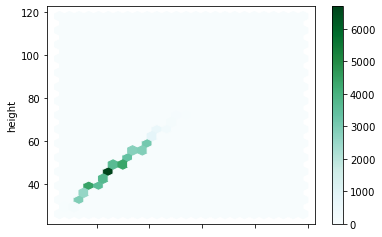

In [10]:
annotations.plot.hexbin(x='width', y='height', gridsize=25) #C='scale', 

In [11]:
slides_path = Path("../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs") if slide.name in slides_train + slides_val}
files

{'BAL 1 Spray 2.svs': WindowsPath('../Slides/BAL 1 Spray 2.svs'),
 'BAL AIA Blickfang Luft.svs': WindowsPath('../Slides/BAL AIA Blickfang Luft.svs'),
 'BAL Booker Spray 3.svs': WindowsPath('../Slides/BAL Booker Spray 3.svs'),
 'BAL Bubi Spray 1.svs': WindowsPath('../Slides/BAL Bubi Spray 1.svs'),
 'BAL cent blue Luft 2.svs': WindowsPath('../Slides/BAL cent blue Luft 2.svs'),
 'BAL Promyk Spray 4.svs': WindowsPath('../Slides/BAL Promyk Spray 4.svs')}

In [12]:
size = 1024 
level = 0
bs = 16
train_images = 500
val_images = 500

In [13]:
train_files = []
val_files = []

In [14]:
for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))

train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [15]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      #max_lighting=0.0,
                      #max_zoom=1.,
                      #max_warp=0.0,
                      #p_affine=0.5,
                      #p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )

In [16]:
def get_y_func(x):
    return x.y

In [17]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=0).normalize()

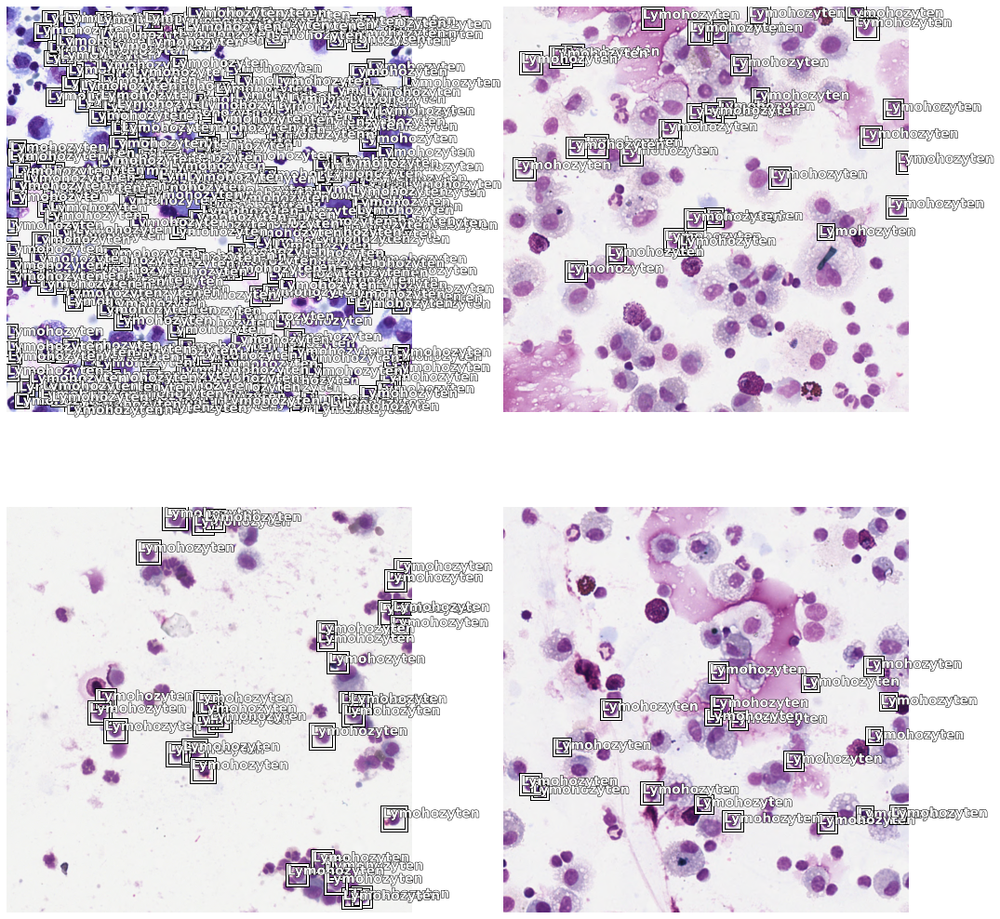

In [18]:
data.show_batch(rows=2, ds_type=DatasetType.Valid, figsize=(15,15))

In [26]:
scales = [.1, .2, 0.3, 0.4, 0.5]
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=scales)

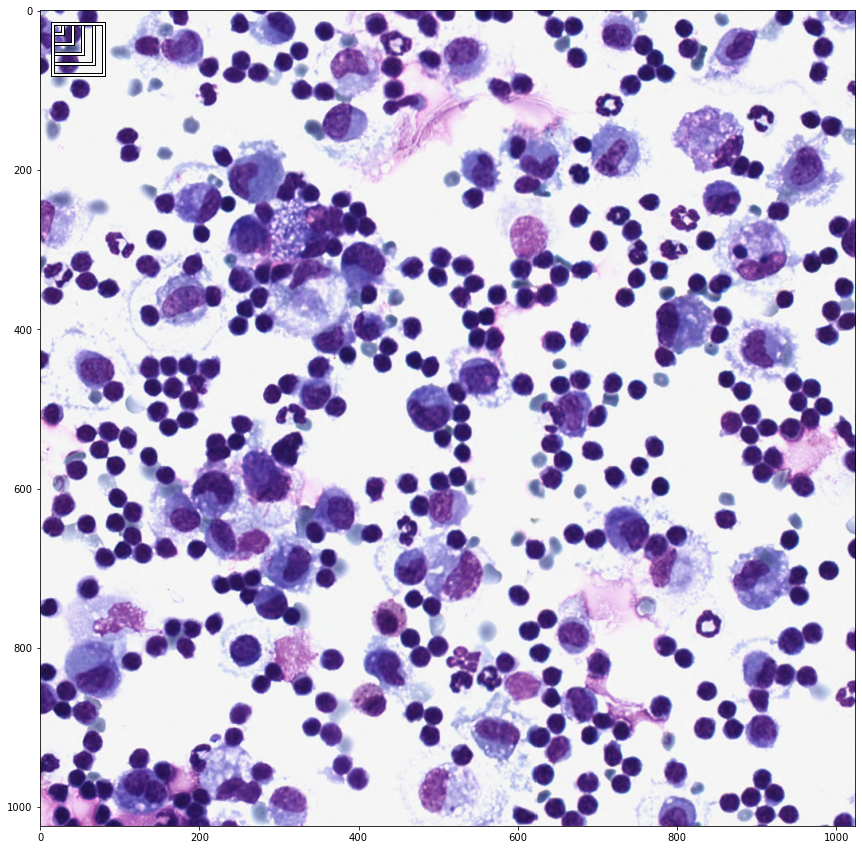

In [27]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:len(scales)]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

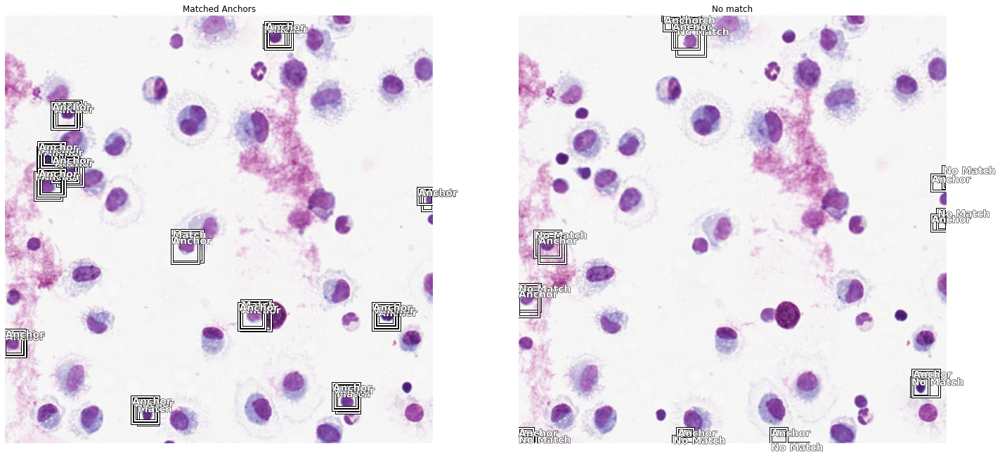

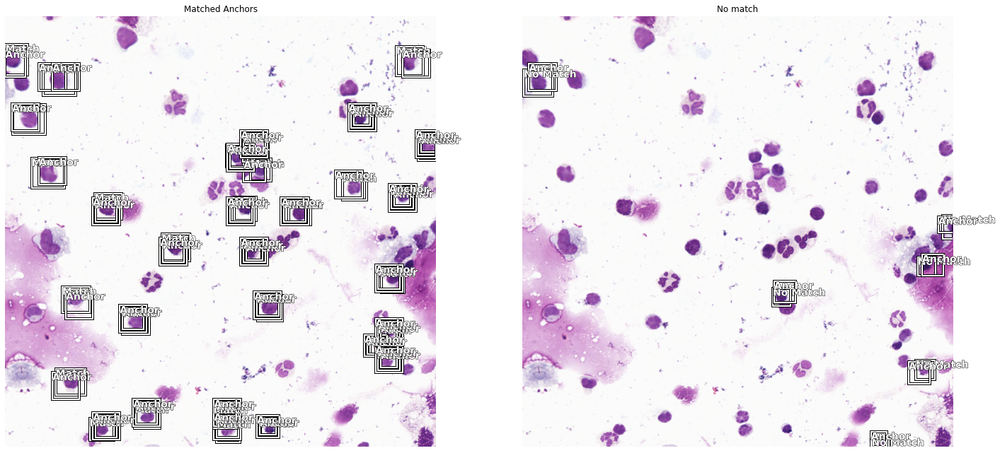

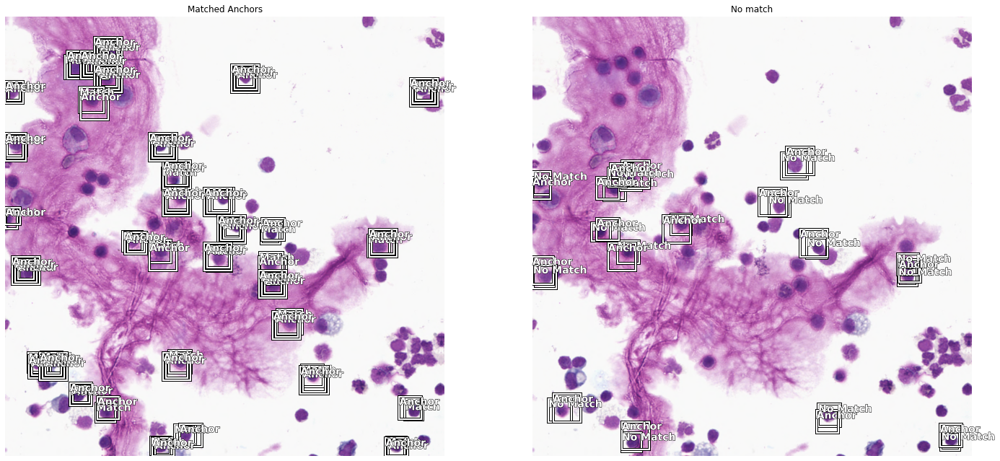

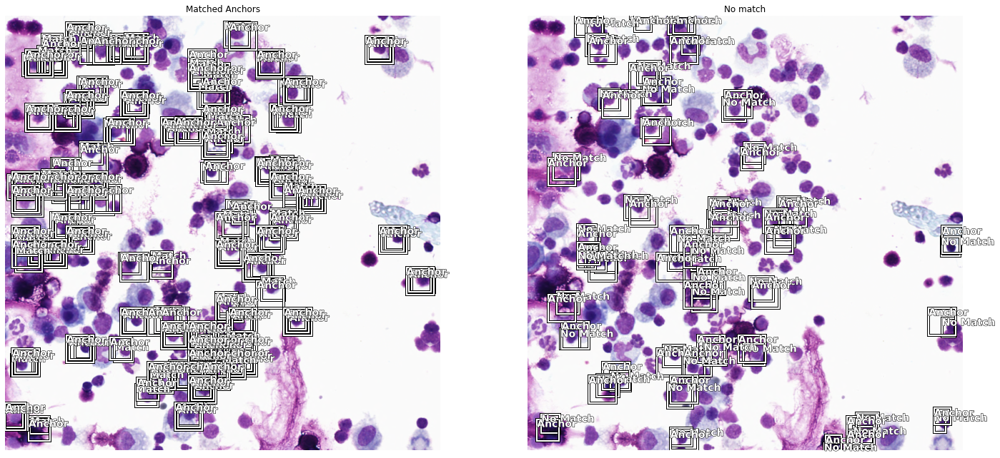

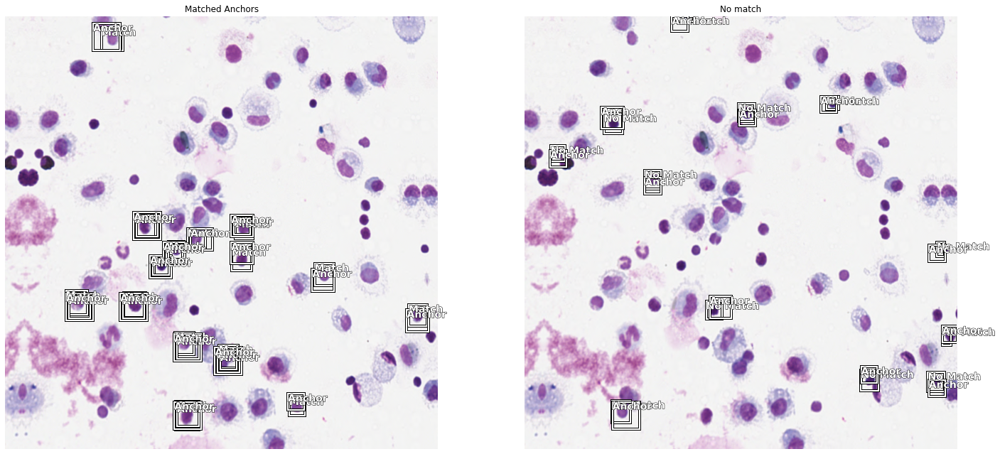

...

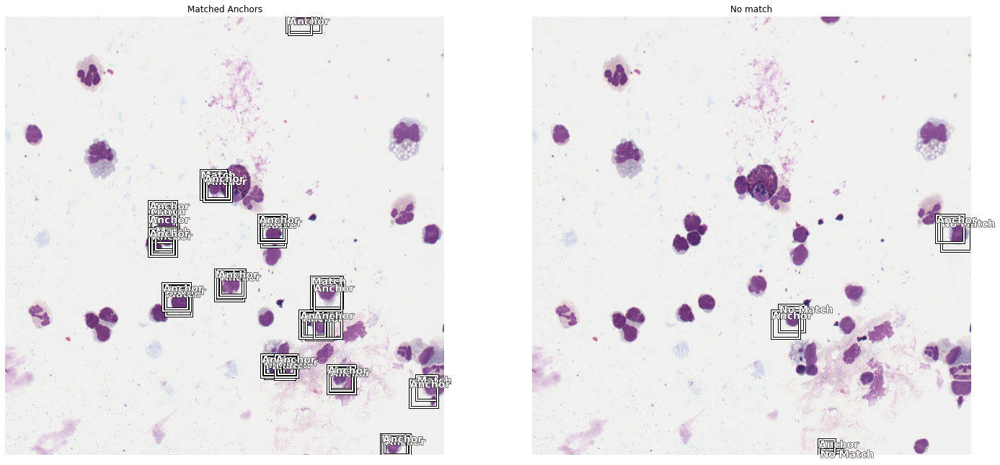

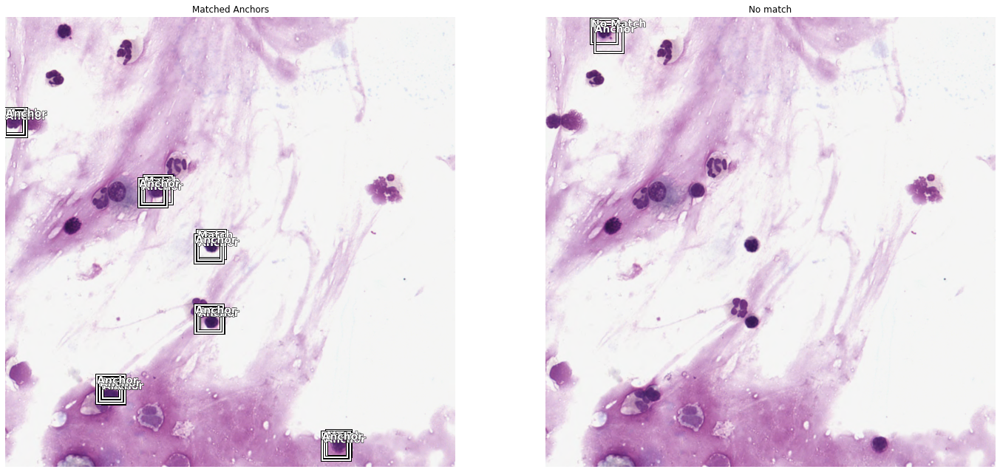

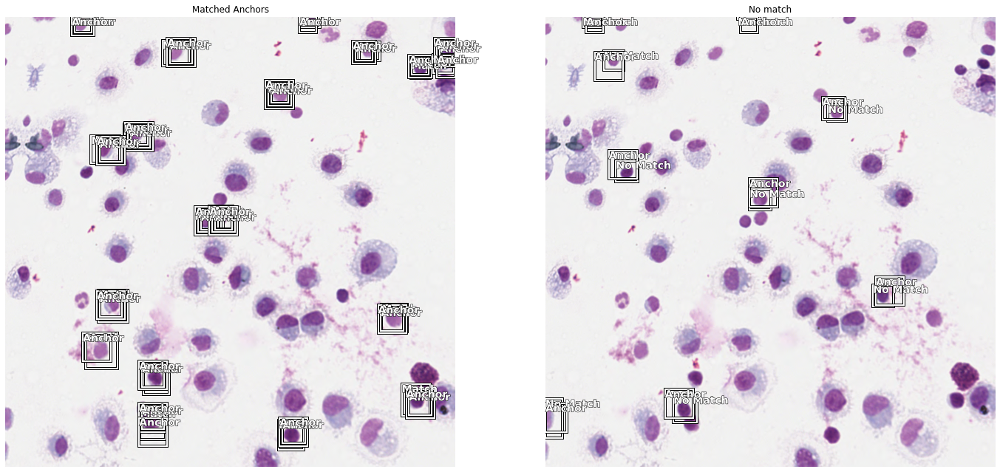

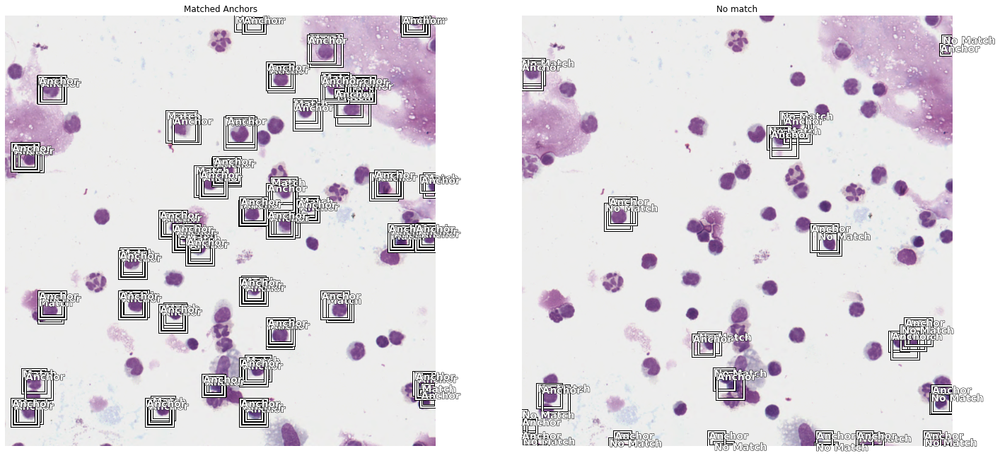

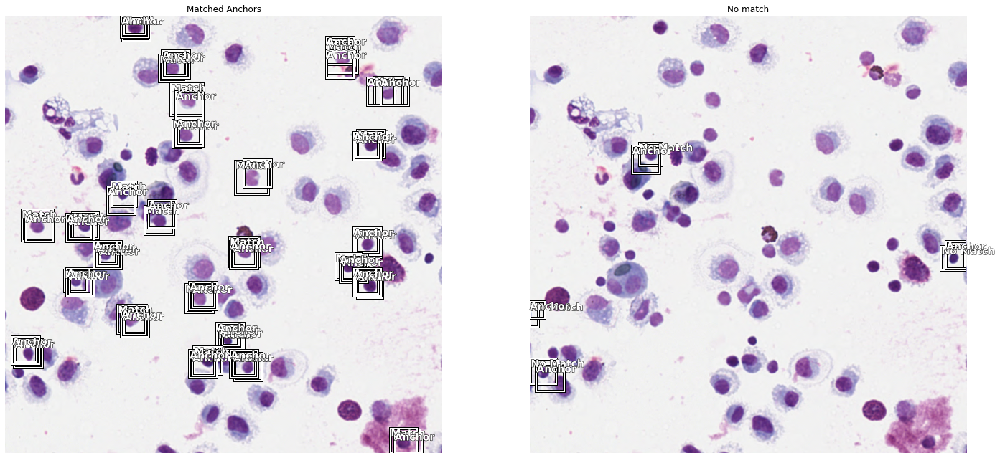

In [28]:
all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(24, 24))

In [33]:
crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=len(scales), sizes=[32], chs=128, final_bias=-4., n_conv=2)

In [34]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40, detect_thresh=0.6)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics], #BBMetrics, ShowGraph
                metrics=[voc])

In [35]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [36]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,1.331811,1.214219,0.315539,0.355331,0.858888,0.315539,09:50
1,0.685803,0.520475,0.174073,0.197871,0.322604,0.174073,06:21
2,0.446983,0.526108,0.221841,0.192368,0.333740,0.221841,07:14


In [37]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.227661,0.475551,0.278390,0.167190,0.308361,0.278390,07:32
1,0.236637,0.507219,0.253329,0.204690,0.302528,0.253329,07:03
2,0.262867,0.644408,0.298048,0.196285,0.448122,0.298048,07:45
3,0.249664,0.544613,0.315953,0.212419,0.332194,0.315953,07:50
4,0.236034,0.418073,0.283800,0.137815,0.280258,0.283800,08:56
5,0.215009,0.537680,0.401259,0.115370,0.422310,0.401259,11:32
6,0.199436,0.396046,0.236005,0.145709,0.250337,0.236005,07:45
7,0.184642,0.410543,0.314759,0.140751,0.269792,0.314759,08:23
8,0.168765,0.378092,0.271349,0.104332,0.273760,0.271349,07:47
9,0.159870,0.362834,0.303098,0.112349,0.250484,0.303098,08:07


In [38]:
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.147726,0.354961,0.215327,0.129412,0.225550,0.215327,06:57
1,0.169245,0.370994,0.293541,0.118405,0.252589,0.293541,08:01
2,0.188305,0.522824,0.105641,0.154179,0.368645,0.105641,06:18
3,0.202626,0.464942,0.261254,0.179931,0.285011,0.261254,07:11
4,0.190455,0.550301,0.380669,0.123375,0.426926,0.380669,08:31
5,0.185114,0.469967,0.359964,0.135180,0.334786,0.359964,08:15
6,0.173641,0.333066,0.235274,0.103318,0.229748,0.235274,07:08
7,0.161149,0.371269,0.314753,0.119626,0.251644,0.314753,08:00
8,0.153069,0.384153,0.298499,0.111959,0.272194,0.298499,07:44
9,0.146188,0.353807,0.305806,0.106784,0.247023,0.305806,07:42


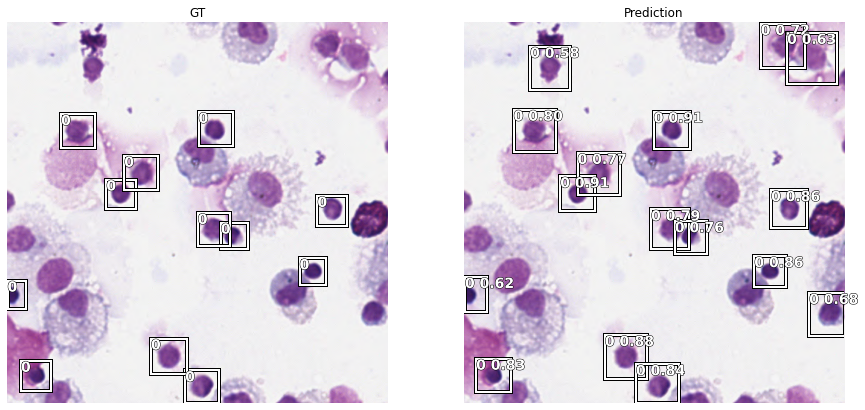

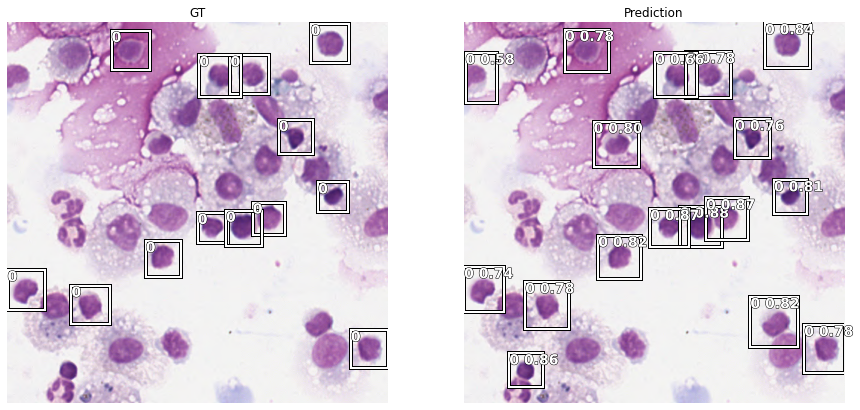

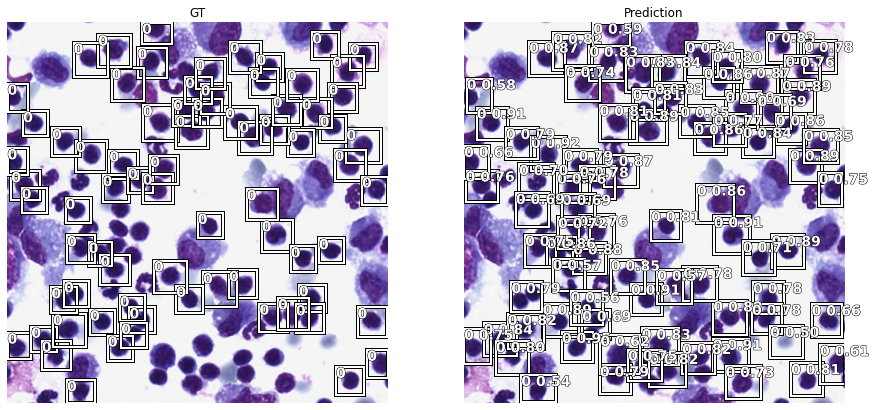

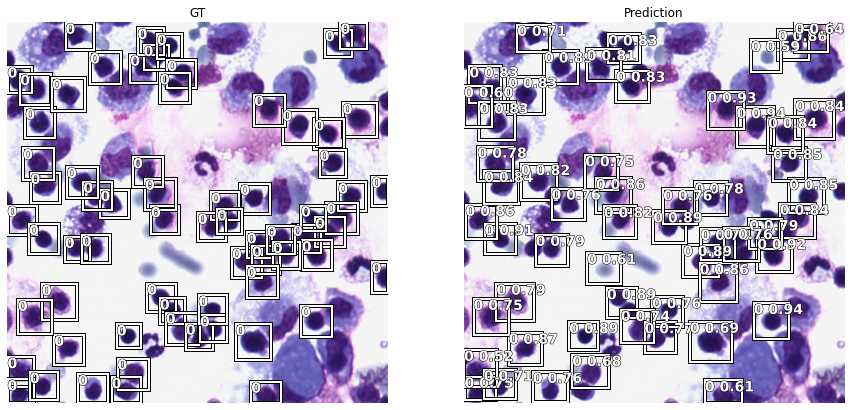

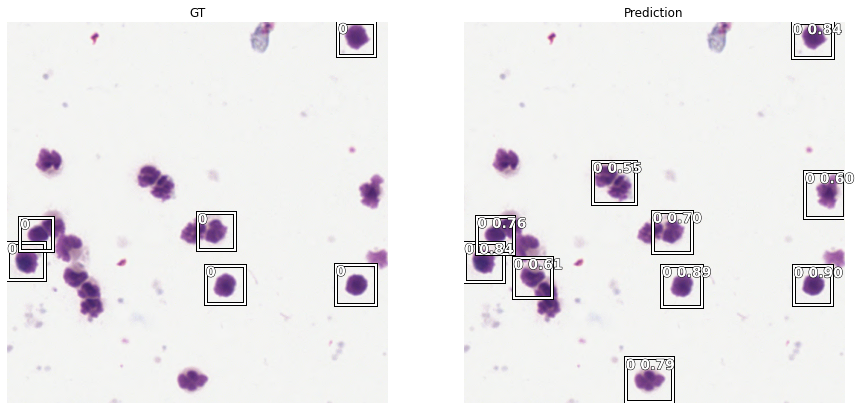

In [43]:
slide_object_result(learn, anchors, detect_thresh=0.5, nms_thresh=0.2)